In [1]:
import emoji as em
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import scipy.stats as stats
import statsmodels.formula.api as smf
import statsmodels.stats.api as sms
import statsmodels.api as sm
from statsmodels.formula.api import ols
import seaborn as sns
sns.set_style('darkgrid')
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.model_selection import train_test_split
from math import sqrt
from sklearn.model_selection import cross_val_score, cross_validate
from sklearn.linear_model import LinearRegression


import warnings
warnings.filterwarnings("ignore")

In [2]:
df = pd.read_csv('Life Expectancy Data.csv')

In [3]:
df = df.rename(columns=lambda x: x.strip())

In [4]:
df.isnull().sum(axis=0)

Country                              0
Year                                 0
Status                               0
Life expectancy                     10
Adult Mortality                     10
infant deaths                        0
Alcohol                            194
percentage expenditure               0
Hepatitis B                        553
Measles                              0
BMI                                 34
under-five deaths                    0
Polio                               19
Total expenditure                  226
Diphtheria                          19
HIV/AIDS                             0
GDP                                448
Population                         652
thinness  1-19 years                34
thinness 5-9 years                  34
Income composition of resources    167
Schooling                          163
dtype: int64

In [5]:
#Replace null values with mean or median 

df['Life expectancy'].fillna(df['Life expectancy'].median(), inplace=True)
df['Adult Mortality'].fillna(df['Adult Mortality'].median(), inplace=True)
df['Alcohol'].fillna(df['Alcohol'].mean(), inplace=True)
df['Hepatitis B'].fillna(df['Hepatitis B'].median(), inplace=True)
df['BMI'].fillna(df['BMI'].mean(), inplace=True)
df['Polio'].fillna(df['Polio'].median(), inplace=True)
df['Total expenditure'].fillna(df['Total expenditure'].mean(), inplace=True)
df['Diphtheria'].fillna(df['Diphtheria'].median(), inplace=True)
df['GDP'].fillna(df['GDP'].median(), inplace=True)
df['Population'].fillna(df['Population'].mean(), inplace=True)
df['thinness  1-19 years'].fillna(df['thinness  1-19 years'].median(), inplace=True)
df['thinness 5-9 years'].fillna(df['thinness 5-9 years'].median(), inplace=True)
df['Income composition of resources'].fillna(df['Income composition of resources'].mean(), inplace=True)
df['Schooling'].fillna(df['Schooling'].mean(), inplace=True)

In [6]:
df.rename({'Life expectancy': 'Life_exp', 'Adult Mortality': 'AdultMortality', 'infant deaths': 'Infant_Deaths', 'percentage expenditure': 'PercentageExpenditure', 'Hepatitis B': 'HepB','Total expenditure':'TotalExpenditure', 'HIV/AIDS':'HIV_AIDS', 'thinness  1-19 years': 'Thinness_1_19Years', 'thinness 5-9 years': 'thinness_5_9Years', 'Income composition of resources': 'IncomeCompositionResources'}, axis=1, inplace=True) 

array([[<AxesSubplot:title={'center':'Year'}>,
        <AxesSubplot:title={'center':'Life_exp'}>,
        <AxesSubplot:title={'center':'AdultMortality'}>,
        <AxesSubplot:title={'center':'Infant_Deaths'}>],
       [<AxesSubplot:title={'center':'Alcohol'}>,
        <AxesSubplot:title={'center':'PercentageExpenditure'}>,
        <AxesSubplot:title={'center':'HepB'}>,
        <AxesSubplot:title={'center':'Measles'}>],
       [<AxesSubplot:title={'center':'BMI'}>,
        <AxesSubplot:title={'center':'under-five deaths'}>,
        <AxesSubplot:title={'center':'Polio'}>,
        <AxesSubplot:title={'center':'TotalExpenditure'}>],
       [<AxesSubplot:title={'center':'Diphtheria'}>,
        <AxesSubplot:title={'center':'HIV_AIDS'}>,
        <AxesSubplot:title={'center':'GDP'}>,
        <AxesSubplot:title={'center':'Population'}>],
       [<AxesSubplot:title={'center':'Thinness_1_19Years'}>,
        <AxesSubplot:title={'center':'thinness_5_9Years'}>,
        <AxesSubplot:title={'center':

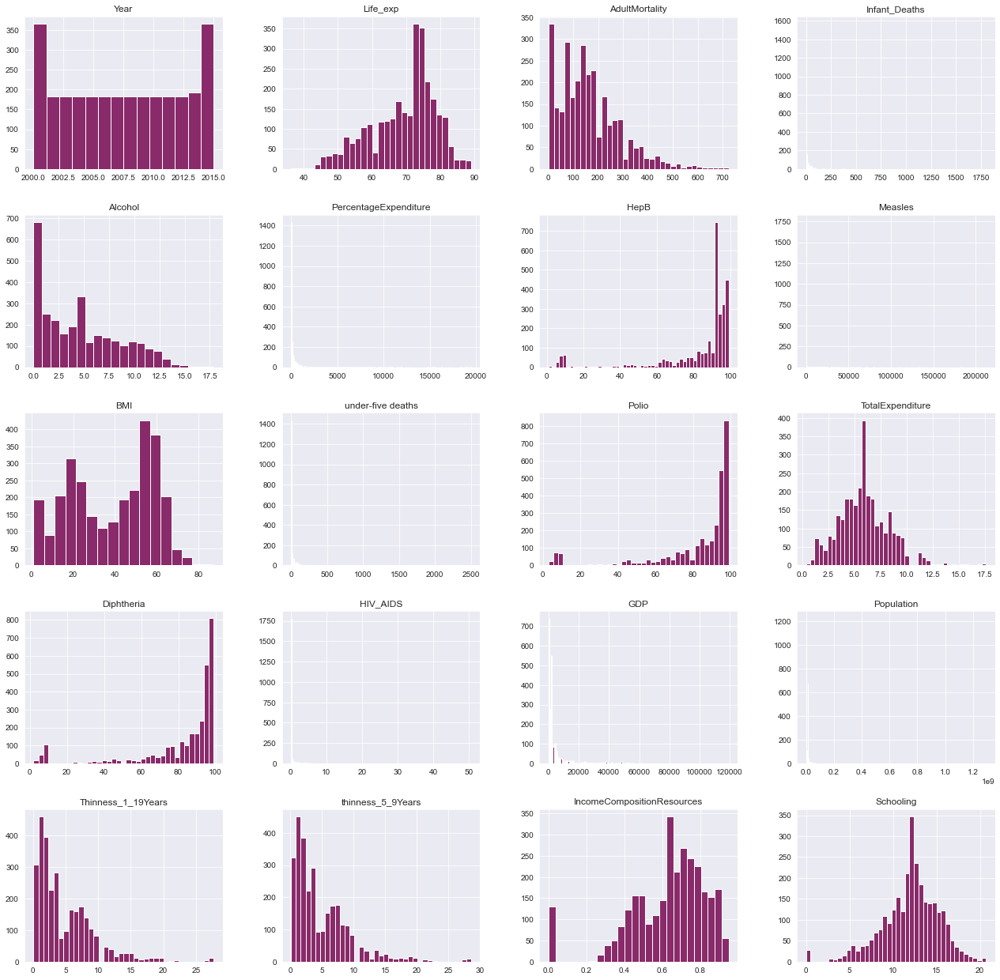

In [7]:
df.hist(bins='auto', color = "#892B6A", figsize=(22,22))

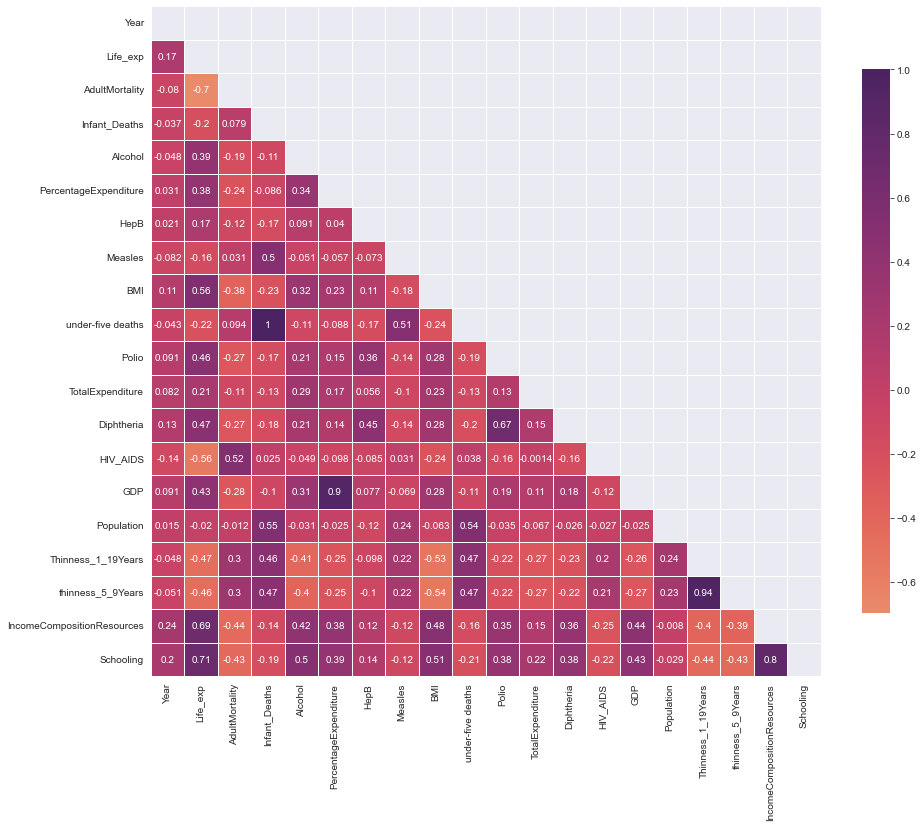

In [8]:
#visualize correlation using heatmap
corr = df.corr()
mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask)] = True

f, ax = plt.subplots(figsize=(15, 20))

sns.heatmap(corr, mask=mask, cmap='flare', vmax=1, center=0,
            square=True, linewidths=.5,annot=True, cbar_kws={"shrink": .5});

In [9]:
df.describe()

,Year,Life_exp,AdultMortality,Infant_Deaths,Alcohol,PercentageExpenditure,HepB,Measles,BMI,under-five deaths,Polio,TotalExpenditure,Diphtheria,HIV_AIDS,GDP,Population,Thinness_1_19Years,thinness_5_9Years,IncomeCompositionResources,Schooling
count,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2.938000e+03,2938.000000,2938.000000,2938.000000,2938.000000
mean,2007.518720,69.234717,164.725664,30.303948,4.602861,738.251295,83.022124,2419.592240,38.321247,42.035739,82.617767,5.938190,82.393125,1.742103,6611.523863,1.275338e+07,4.821886,4.852144,0.627551,11.992793
std,4.613841,9.509115,124.086215,117.926501,3.916288,1987.914858,22.996984,11467.272489,19.927677,160.445548,23.367166,2.400274,23.655562,5.077785,13296.603449,5.381546e+07,4.397621,4.485854,0.204820,3.264381
min,2000.000000,36.300000,1.000000,0.000000,0.010000,0.000000,1.000000,0.000000,1.000000,0.000000,3.000000,0.370000,2.000000,0.100000,1.681350,3.400000e+01,0.100000,0.100000,0.000000,0.000000
25%,2004.000000,63.200000,74.000000,0.000000,1.092500,4.685343,82.000000,0.000000,19.400000,0.000000,78.000000,4.370000,78.000000,0.100000,580.486996,4.189172e+05,1.600000,1.600000,0.504250,10.300000
50%,2008.000000,72.100000,144.000000,3.000000,4.160000,64.912906,92.000000,17.000000,43.000000,4.000000,93.000000,5.938190,93.000000,0.100000,1766.947595,3.675929e+06,3.300000,3.300000,0.662000,12.100000
75%,2012.000000,75.600000,227.000000,22.000000,7.390000,441.534144,96.000000,360.250000,56.100000,28.000000,97.000000,7.330000,97.000000,0.800000,4779.405190,1.275338e+07,7.100000,7.200000,0.772000,14.100000
max,2015.000000,89.000000,723.000000,1800.000000,17.870000,19479.911610,99.000000,212183.000000,87.300000,2500.000000,99.000000,17.600000,99.000000,50.600000,119172.741800,1.293859e+09,27.700000,28.600000,0.948000,20.700000


In [10]:
# under-five deaths have almost the same definition as Infant Deaths and have a correlation of 1. Therefore, one should be removed. Under-five deaths was chosen to be dropped. 

df.drop(columns=[ 'under-five deaths','Year'], axis=1, inplace=True)

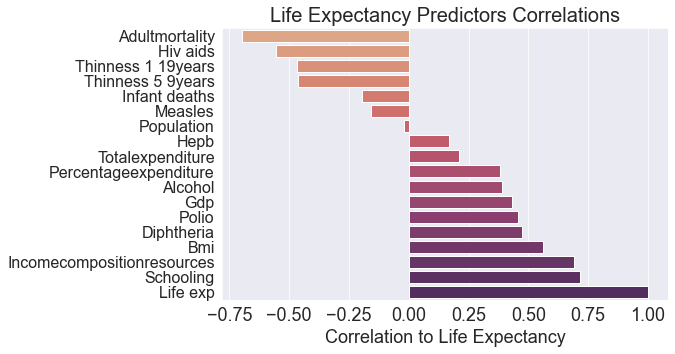

In [12]:
corr_data = df.corr()['Life_exp'].sort_values()
corr_data

fig, ax = plt.subplots(figsize=(8,5))
sns.barplot(x=corr_data.values, y=corr_data.index, orient='h', palette='flare')
ylabels = [item.capitalize() for item in corr_data.index]
ylabels = [item.split('_') for item in ylabels]
ylabels = [' '.join(item) for item in ylabels]
ax.set_yticklabels(ylabels, size=16)
ax.tick_params(axis='x', which='major', labelsize=18)
ax.set_xlabel('Correlation to Life Expectancy', size=18)
ax.set_title('Life Expectancy Predictors Correlations', size=20)
plt.savefig("Feature_correlations.png");

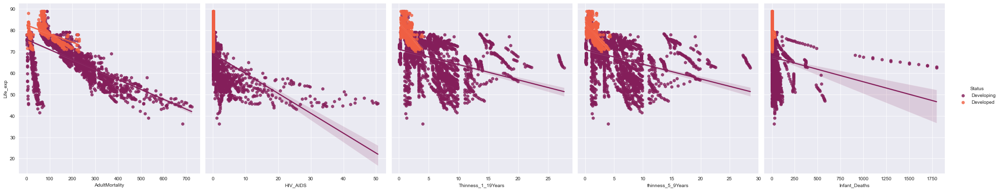

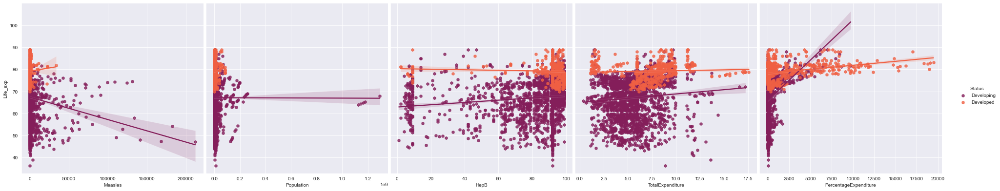

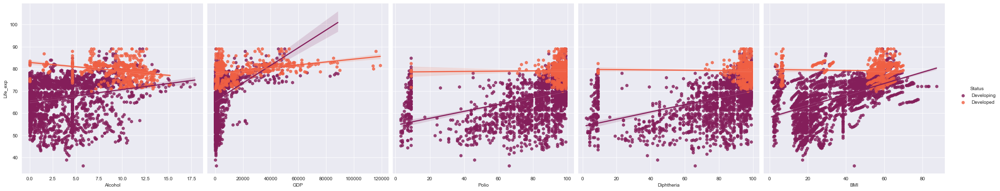

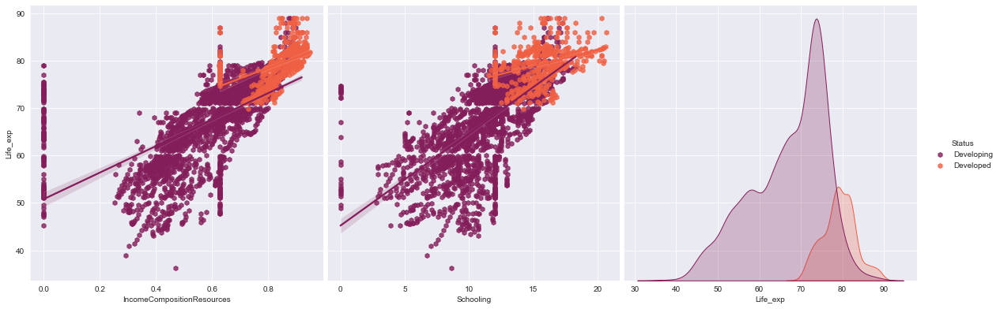

In [13]:
for i in range(0, len(corr_data.index), 5):
    sns.pairplot(data=df,
                x_vars = corr_data.index[i : i + 5 ],
                y_vars = ['Life_exp'], hue="Status", kind="reg", palette='rocket', markers="h", height=5.5
                )
# At firt look, all variables seem to have a rough linear relationship with Life Expectancy, except for Population. 

In [14]:
#Drop variables that have a <0.2 correlation with Life Expectancy 
df.drop(columns=[ 'HepB', 'Measles', 'Population' ], axis=1, inplace=True)

<AxesSubplot:xlabel='Life_exp', ylabel='Density'>

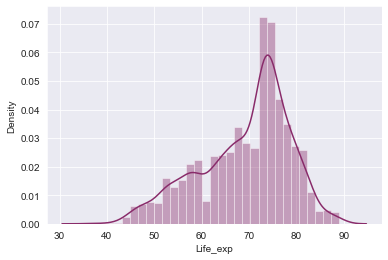

In [15]:
sns.distplot(df['Life_exp'], color = "#892B6A")

### Linear Regression Assumption checks

1. Linearity
2. Normality (residuals)
3. Homoscedasticity

In [16]:
def model_diagnostic(model, x, x_name, y):
    
    residuals = model.resid
    
    f = plt.figure()
    f, axes = plt.subplots(nrows = 1, ncols = 3, sharex=False, sharey = False, figsize=(85,20), squeeze=False)
    
    f.text(s="Model Diagnostic Summary", x=.40, y=1.15, fontsize=65)
    f.text(s="r-Squared: {r}".format(r=round(model.rsquared, 2)), x=.40, y=1.05, fontsize=50, fontname='serif')
    f.text(s="p-value: {p}".format(p= model.f_pvalue), x=.53, y=1.05, fontsize=50, fontname='serif')
    
    f.text(s='Residuals Histogram', x=.45, y=.93, fontsize=55, fontname='serif')
    
    sm.graphics.qqplot(residuals, dist=stats.norm, line='45', marker='.', markerfacecolor='darkorange', alpha=0.3, fit=True, ax=axes[0][0])    
    plt.show;
    
    f.text(s='QQ Plot', x=.20, y=.93, fontsize=55, fontname='serif')
    
    axes[0][1].hist(residuals)
    plt.show;
    
    sns.residplot(x, y, ax=axes[0][2])
 
    f.text(s='Residuals vs {x}'.format(x=x_name), x=.73, y=.93, fontsize=55, fontname='serif')
    plt.tight_layout;
    plt.show;

<Figure size 432x288 with 0 Axes>

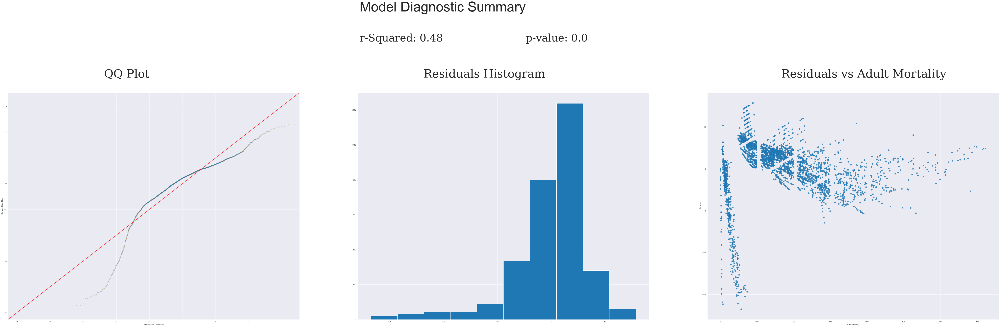

<Figure size 432x288 with 0 Axes>

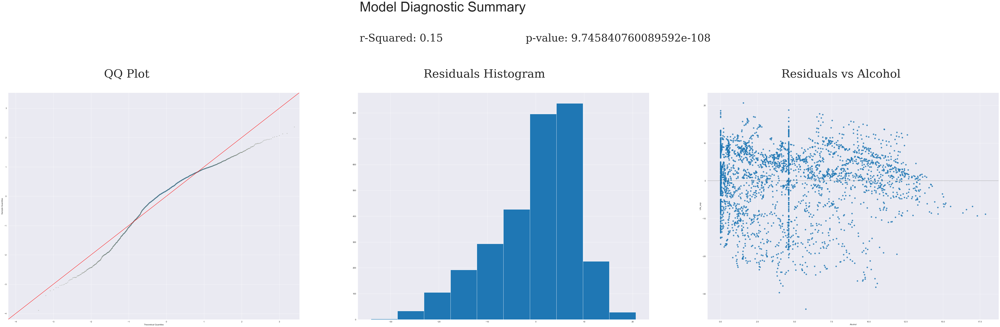

<Figure size 432x288 with 0 Axes>

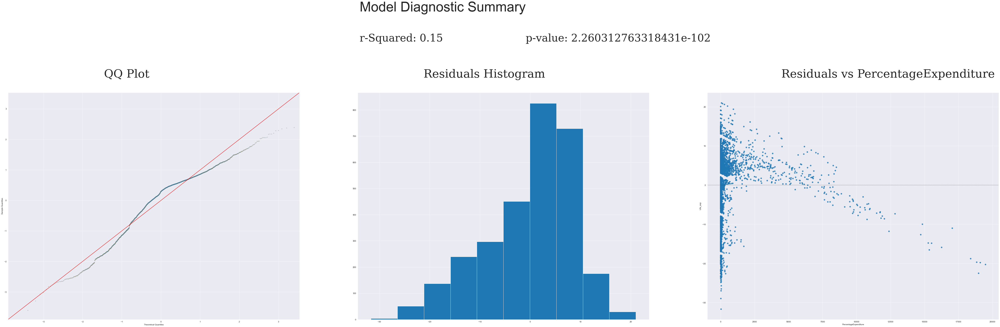

<Figure size 432x288 with 0 Axes>

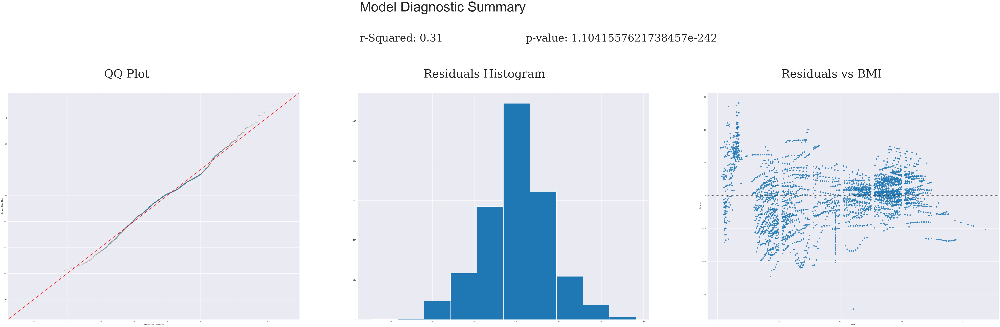

<Figure size 432x288 with 0 Axes>

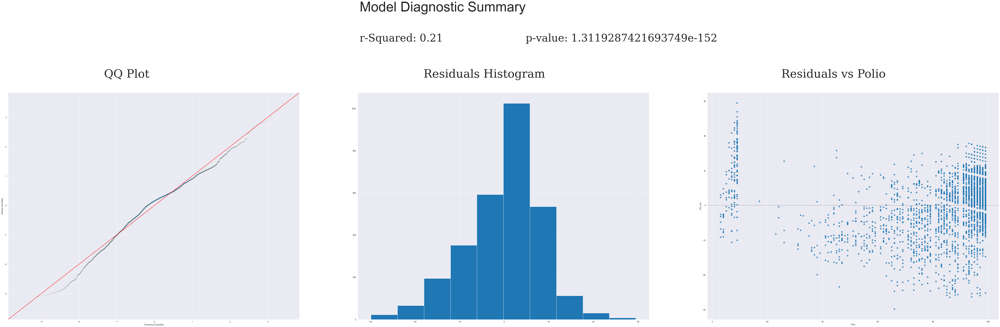

<Figure size 432x288 with 0 Axes>

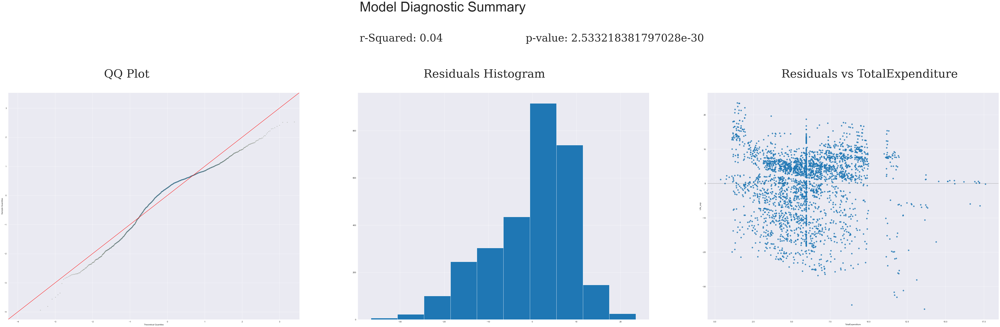

<Figure size 432x288 with 0 Axes>

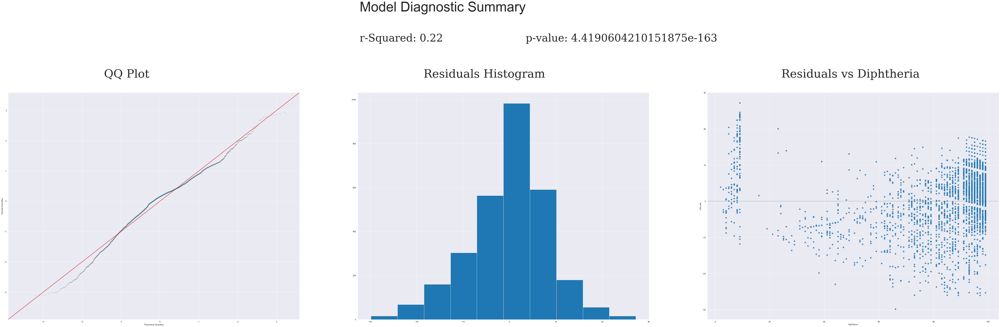

In [17]:
Life_exp = df['Life_exp']

f = "Life_exp~AdultMortality"
AdultMortality = smf.ols(formula=f, data=df).fit()
model_diagnostic(AdultMortality, df['AdultMortality'], 'Adult Mortality', Life_exp)

f = "Life_exp~Alcohol"
Alcohol = smf.ols(formula=f, data=df).fit()
model_diagnostic(Alcohol, df['Alcohol'], 'Alcohol', Life_exp)

f = "Life_exp~PercentageExpenditure"
PercentageExpenditure = smf.ols(formula=f, data=df).fit()
model_diagnostic(PercentageExpenditure, df['PercentageExpenditure'], 'PercentageExpenditure', Life_exp)

f = "Life_exp~BMI"
BMI = smf.ols(formula=f, data=df).fit()
model_diagnostic(BMI, df['BMI'], 'BMI', Life_exp)

f = "Life_exp~Polio"
Polio = smf.ols(formula=f, data=df).fit()
model_diagnostic(Polio, df['Polio'], 'Polio', Life_exp)

f = "Life_exp~TotalExpenditure"
TotalExpenditure = smf.ols(formula=f, data=df).fit()
model_diagnostic(TotalExpenditure, df['TotalExpenditure'], 'TotalExpenditure', Life_exp)

f = "Life_exp~Diphtheria"
Diphtheria = smf.ols(formula=f, data=df).fit()
model_diagnostic(Diphtheria, df['Diphtheria'], 'Diphtheria', Life_exp)

<Figure size 432x288 with 0 Axes>

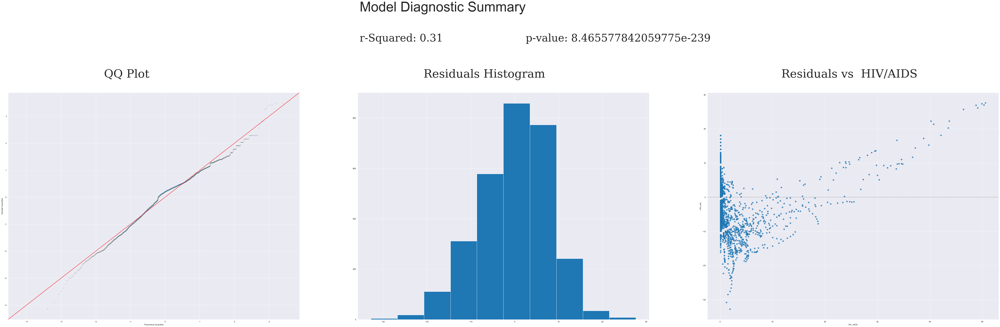

<Figure size 432x288 with 0 Axes>

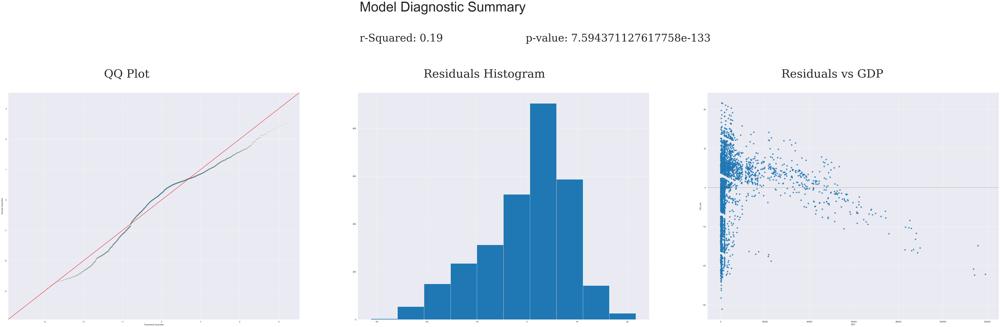

<Figure size 432x288 with 0 Axes>

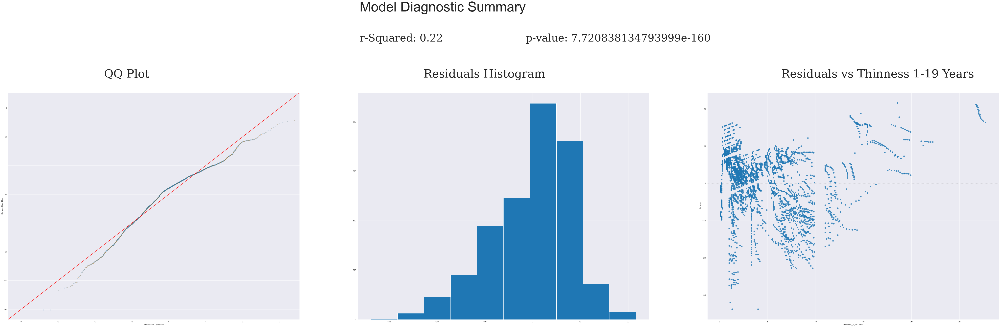

<Figure size 432x288 with 0 Axes>

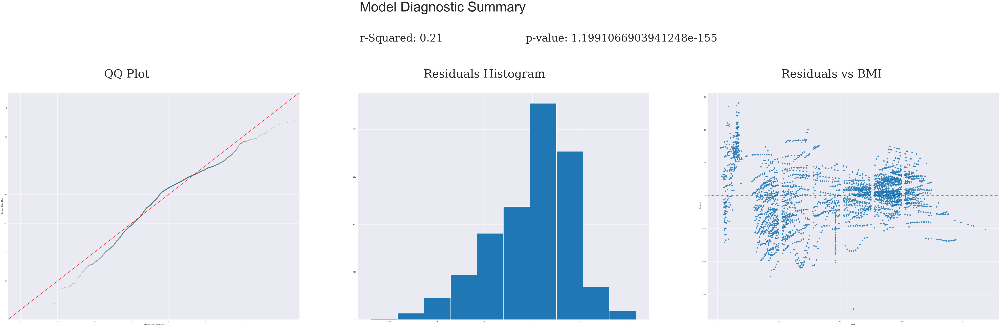

<Figure size 432x288 with 0 Axes>

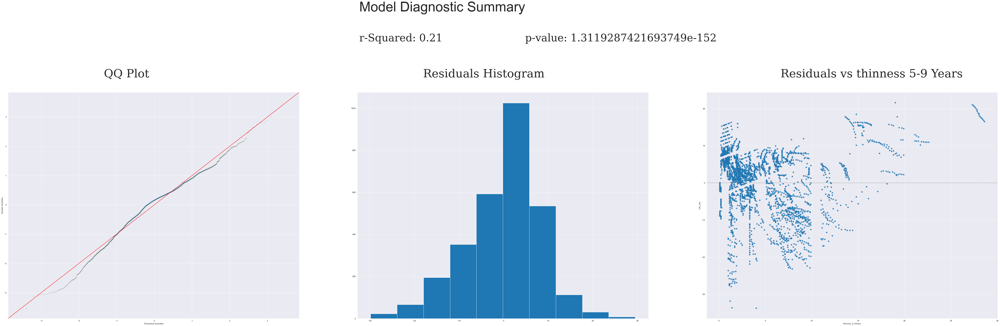

<Figure size 432x288 with 0 Axes>

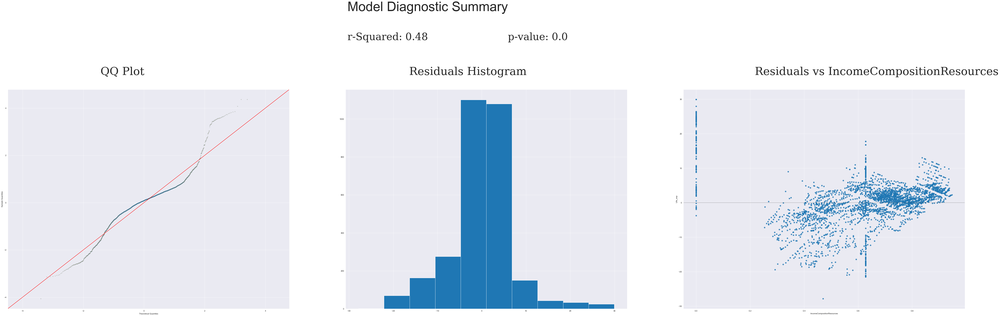

<Figure size 432x288 with 0 Axes>

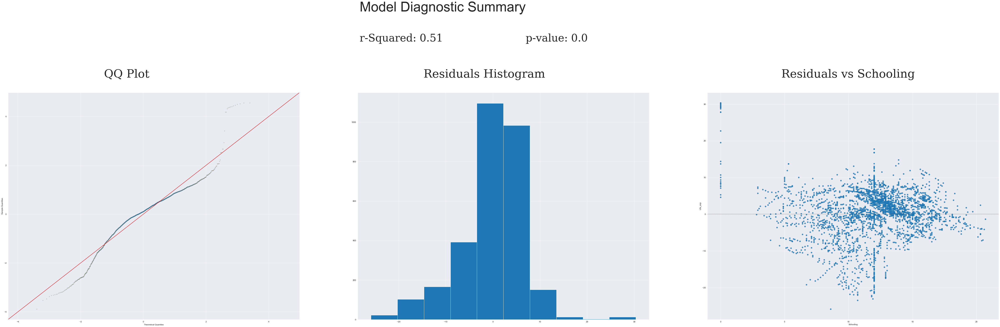

In [18]:
f = "Life_exp~HIV_AIDS"
HIV_AIDS = smf.ols(formula=f, data=df).fit()
model_diagnostic(HIV_AIDS, df['HIV_AIDS'], ' HIV/AIDS', Life_exp)

f = "Life_exp~GDP"
GDP = smf.ols(formula=f, data=df).fit()
model_diagnostic(GDP, df['GDP'], 'GDP', Life_exp)


f = "Life_exp~Thinness_1_19Years"
Thinness_1_19Years = smf.ols(formula=f, data=df).fit()
model_diagnostic(Thinness_1_19Years, df['Thinness_1_19Years'], 'Thinness 1-19 Years', Life_exp)


f = "Life_exp~thinness_5_9Years"
BMI = smf.ols(formula=f, data=df).fit()
model_diagnostic(BMI, df['BMI'], 'BMI', Life_exp)

f = "Life_exp~Polio"
thinness_5_9Years = smf.ols(formula=f, data=df).fit()
model_diagnostic(thinness_5_9Years, df['thinness_5_9Years'], 'thinness 5-9 Years', Life_exp)

f = "Life_exp~IncomeCompositionResources"
IncomeCompositionResources = smf.ols(formula=f, data=df).fit()
model_diagnostic(IncomeCompositionResources, df['IncomeCompositionResources'], 'IncomeCompositionResources', Life_exp)

f = "Life_exp~Schooling"
Schooling = smf.ols(formula=f, data=df).fit()
model_diagnostic(Schooling, df['Schooling'], 'Schooling', Life_exp)


 Except for Alcohol and Adult Mortaility, all variables appear to adheare to the assupmuption of normal distribution of residuals.
 
However, few variables appear to adhere the homoscedasticity assumption. In particular, HIV/AIDs, GPD, Thinness, and Percentage Expenditure violate these assumptions. 


In [19]:
Predictors= df.drop(columns=['Life_exp', 'Country', 'Status' ], axis=1)
Life_exp=df['Life_exp']
df1 = pd.DataFrame(df)


## Baseline Model 

In [20]:
Model_B = smf.ols(formula="Life_exp ~ AdultMortality +  Infant_Deaths + Alcohol +PercentageExpenditure + BMI + Polio+TotalExpenditure + Diphtheria+ HIV_AIDS + GDP + Thinness_1_19Years + thinness_5_9Years + IncomeCompositionResources + Schooling", data=df1).fit()
Model_B.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:               Life_exp   R-squared:                       0.807
Model:                            OLS   Adj. R-squared:                  0.806
Method:                 Least Squares   F-statistic:                     871.7
Date:                Sat, 05 Nov 2022   Prob (F-statistic):               0.00
Time:                        23:25:49   Log-Likelihood:                -8370.6
No. Observations:                2938   AIC:                         1.677e+04
Df Residuals:                    2923   BIC:                         1.686e+04
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
==============================================================================================
                                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------
Intercept                     52.3281      0.553     94.683      0.000      51.244      53.412
AdultMortality                -0.0206      0.001    -25.214      0.000      -0.022      -0.019
Infant_Deaths                 -0.0017      0.001     -2.197      0.028      -0.003      -0.000
Alcohol                        0.0764      0.025      3.108      0.002       0.028       0.125
PercentageExpenditure          0.0001   9.28e-05      1.342      0.180   -5.74e-05       0.000
BMI                            0.0461      0.005      9.057      0.000       0.036       0.056
Polio                          0.0304      0.005      6.656      0.000       0.021       0.039
TotalExpenditure               0.1094      0.035      3.124      0.002       0.041       0.178
Diphtheria                     0.0407      0.005      8.973      0.000       0.032       0.050
HIV_AIDS                      -0.4842      0.018    -26.735      0.000      -0.520      -0.449
GDP                         3.507e-05   1.42e-05      2.478      0.013    7.32e-06    6.28e-05
Thinness_1_19Years            -0.1059      0.052     -2.036      0.042      -0.208      -0.004
thinness_5_9Years              0.0351      0.051      0.685      0.493      -0.065       0.136
IncomeCompositionResources     6.9128      0.652     10.608      0.000       5.635       8.191
Schooling                      0.6860      0.043     15.948      0.000       0.602       0.770
==============================================================================
Omnibus:                      141.089   Durbin-Watson:                   0.702
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              411.651
Skew:                          -0.194   Prob(JB):                     4.08e-90
Kurtosis:                       4.792   Cond. No.                     1.28e+05
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.28e+05. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

#### Testing the Baseline Model 

In [21]:
X_b = df1.drop(columns=['Life_exp', 'Country', 'Status' ], axis=1)
y_b = df1['Life_exp']
Xb_train, Xb_test, yb_train, yb_test = train_test_split(X_b, y_b, random_state=1)

linreg = LinearRegression()
linreg.fit(Xb_train, yb_train)
LinearRegression()

LinearRegression()

In [22]:
yb_hat_train = linreg.predict(Xb_train)
yb_hat_test = linreg.predict(Xb_test)

In [66]:
train_mseb = mean_squared_error(yb_train, yb_hat_train)
test_mseb = mean_squared_error(yb_test, yb_hat_test)
print('Train Mean Squared Error:', train_mseb)
print('Test Mean Squared Error: ', test_mseb)

Train Mean Squared Error: 17.311132972463064
Test Mean Squared Error:  18.13785571360985


#### Cross Validation 

Difference: -0.1499801758483644


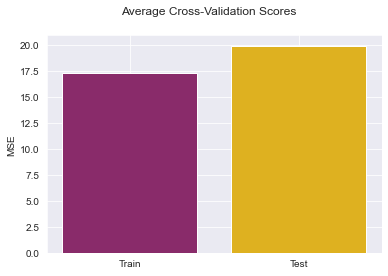

In [24]:
cv_5_results = -cross_val_score(linreg, X_b, y_b, cv=5, scoring="neg_mean_squared_error")
print('Difference:', ((train_mseb-cv_5_results.mean())/ train_mseb))

#train_avgB = -cross_validate["train_score"].mean()
#test_avgB = -cross_validate["test_score"].mean()
#print('Difference:', (train_avgB - test_avgB)/train_avgB)
fig, ax = plt.subplots()
labels = ["Train", "Test"]
colors = ["#892B6A", "#DEB120"]
ax.bar(labels, [train_mseb, cv_5_results.mean()], color=colors)
ax.set_ylabel("MSE")
fig.suptitle("Average Cross-Validation Scores");

To improve the baseline model, we'lllook at a) possible multicollinearity among the predictors and b) improving the distributions to closely conform to a normal distribution. 

 To limit multicollinearity, let's look at which pairs of features have a correlation of .75 or higher.

In [25]:
Multicollinear_Features = []
Multicollinear_Corr = []
def check_multicollinearity(feature):
    for idx, correlation in corr[feature].T.iteritems():
        if correlation >= .75 and idx != feature:
            Multicollinear_Features.append([feature, idx])
            Multicollinear_Corr.append(correlation)
            
for feature in corr:
    check_multicollinearity(feature)
MC_df = pd.DataFrame(
    {'Correlations':Multicollinear_Corr, 'Features': Multicollinear_Features}
    ).sort_values(by='Correlations', ascending=False)
MC_df

,Correlations,Features
0,0.996629,"[Infant_Deaths, under-five deaths]"
2,0.996629,"[under-five deaths, Infant_Deaths]"
4,0.939187,"[Thinness_1_19Years, thinness_5_9Years]"
5,0.939187,"[thinness_5_9Years, Thinness_1_19Years]"
1,0.901819,"[PercentageExpenditure, GDP]"
3,0.901819,"[GDP, PercentageExpenditure]"
6,0.796207,"[IncomeCompositionResources, Schooling]"
7,0.796207,"[Schooling, IncomeCompositionResources]"


In [67]:
#We have four unique pairs, therefore we can simple remove one predictor from each pair. 
#Under-five deaths has already been removed, so we just need to remove an additional three.  

df1.drop(columns=['PercentageExpenditure','thinness_5_9Years', 'IncomeCompositionResources'], axis=1, inplace=True)

KeyError: "['PercentageExpenditure', 'thinness_5_9Years', 'IncomeCompositionResources'] not found in axis"

In [27]:
name = ['Jarque-Bera','Prob','Skew', 'Kurtosis']
test = sms.jarque_bera(Model_B.resid)
list(zip(name, test))

[('Jarque-Bera', 411.65129631780707),
 ('Prob', 4.083727648175934e-90),
 ('Skew', -0.19407153727544488),
 ('Kurtosis', 4.7922196445849785)]

<AxesSubplot:xlabel='Life_exp', ylabel='Density'>

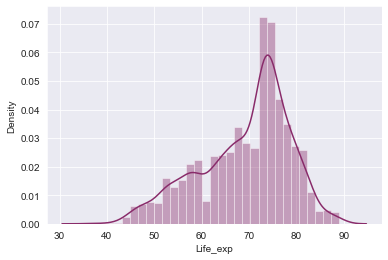

In [28]:
sns.distplot(df1['Life_exp'], color='#892B6A')

Our model diagnostics shows that we have has issues with skewness and non-normal distribution. 

In [29]:
#remove outliers
for col in df1.columns:
    if  (col=='Country') or (col=='Status'):
        pass
    else:
        df1=df1[np.abs(df1[col]-df1[col].mean())<=(3*df1[col].std())]

In [31]:
log_cols = ['Life_exp','AdultMortality','Alcohol', 'BMI', 'Polio',
       'TotalExpenditure', 'Diphtheria', 'HIV_AIDS', 'Thinness_1_19Years',
       'GDP']
for col in log_cols:
        df1[f'{col}_log'] = df1[col].map(lambda x: np.log(x))

In [32]:
df1.drop(columns=['Life_exp', 'AdultMortality','Alcohol', 'BMI', 'Polio',
       'TotalExpenditure', 'Diphtheria', 'HIV_AIDS', 'Thinness_1_19Years', 'GDP'], axis=1, inplace=True)

array([[<AxesSubplot:title={'center':'Infant_Deaths'}>,
        <AxesSubplot:title={'center':'Schooling'}>,
        <AxesSubplot:title={'center':'Life_exp_log'}>],
       [<AxesSubplot:title={'center':'AdultMortality_log'}>,
        <AxesSubplot:title={'center':'Alcohol_log'}>,
        <AxesSubplot:title={'center':'BMI_log'}>],
       [<AxesSubplot:title={'center':'Polio_log'}>,
        <AxesSubplot:title={'center':'TotalExpenditure_log'}>,
        <AxesSubplot:title={'center':'Diphtheria_log'}>],
       [<AxesSubplot:title={'center':'HIV_AIDS_log'}>,
        <AxesSubplot:title={'center':'Thinness_1_19Years_log'}>,
        <AxesSubplot:title={'center':'GDP_log'}>]], dtype=object)

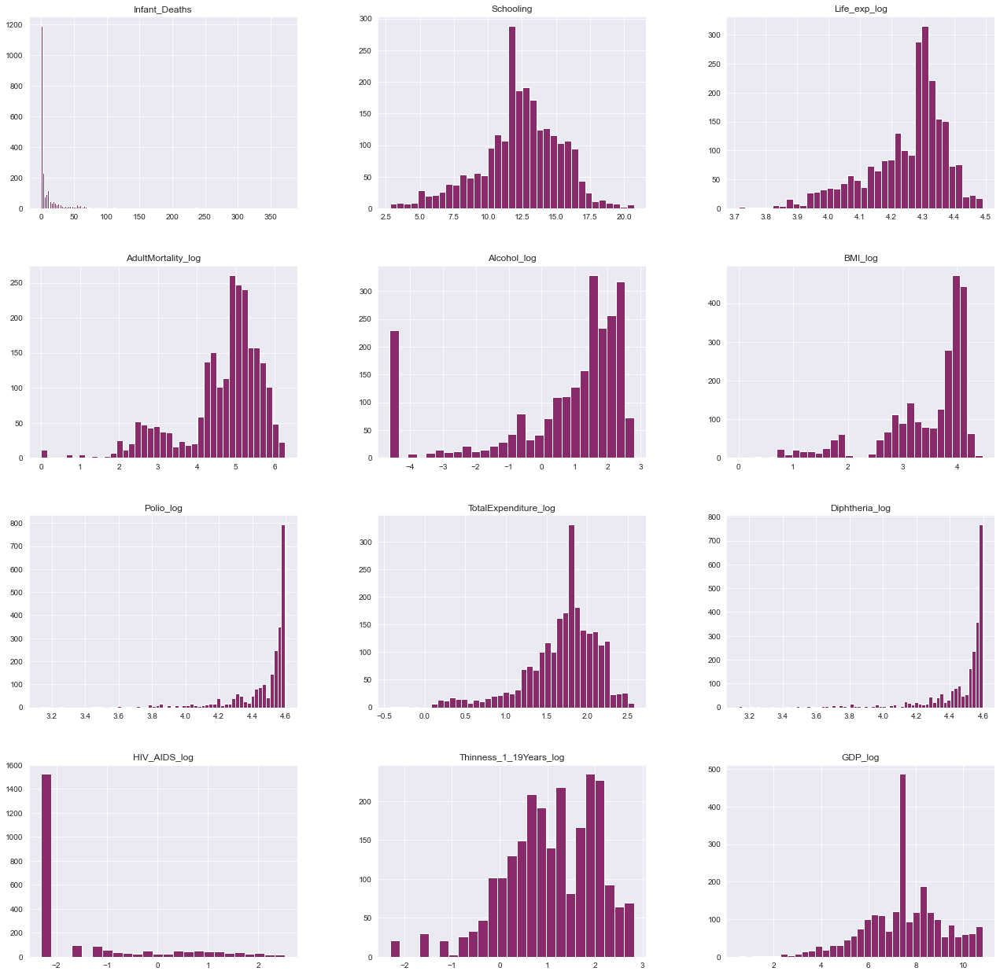

In [69]:
df1.hist(bins='auto', color = "#892B6A", figsize=(22,22))

#Our variables do now appear to be slighty less skewed 

In [33]:
df_log = pd.DataFrame(df1)

###  Model 1 

Model changes:
1. Removed *PercentageExpenditure*, *thinness_5_9Years*, and *IncomeCompositionResources* to limit multicollinearity. 
2. Performed log transformation on all continuous variables. 
3. Removed outliers 

In [34]:
Model_1 = smf.ols(formula='Life_exp_log ~ AdultMortality_log + Infant_Deaths + Alcohol_log + BMI_log + Polio_log+ TotalExpenditure_log + Diphtheria_log + HIV_AIDS_log + GDP_log + Thinness_1_19Years_log + Schooling', data=df_log).fit()
Model_1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:           Life_exp_log   R-squared:                       0.802
Model:                            OLS   Adj. R-squared:                  0.802
Method:                 Least Squares   F-statistic:                     867.9
Date:                Sat, 05 Nov 2022   Prob (F-statistic):               0.00
Time:                        23:25:53   Log-Likelihood:                 3418.6
No. Observations:                2362   AIC:                            -6813.
Df Residuals:                    2350   BIC:                            -6744.
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
==========================================================================================
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
Intercept                  3.5052      0.033    107.623      0.000       3.441       3.569
AdultMortality_log        -0.0104      0.001     -8.569      0.000      -0.013      -0.008
Infant_Deaths             -0.0002   3.53e-05     -5.914      0.000      -0.000      -0.000
Alcohol_log                0.0024      0.001      3.811      0.000       0.001       0.004
BMI_log                    0.0018      0.002      1.118      0.264      -0.001       0.005
Polio_log                  0.0739      0.021      3.585      0.000       0.033       0.114
TotalExpenditure_log       0.0022      0.003      0.794      0.427      -0.003       0.007
Diphtheria_log             0.0526      0.019      2.799      0.005       0.016       0.089
HIV_AIDS_log              -0.0387      0.001    -32.212      0.000      -0.041      -0.036
GDP_log                    0.0053      0.001      6.053      0.000       0.004       0.007
Thinness_1_19Years_log    -0.0122      0.002     -8.037      0.000      -0.015      -0.009
Schooling                  0.0110      0.001     17.418      0.000       0.010       0.012
==============================================================================
Omnibus:                      237.828   Durbin-Watson:                   0.472
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              675.719
Skew:                          -0.538   Prob(JB):                    1.86e-147
Kurtosis:                       5.389   Cond. No.                     1.18e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.18e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

Out model's R-square has remained high at 0.8, however, the skew and kurtosis values have actually increased slightly. Skew and kurtosis remain an issue.  

In [35]:
X1 = df_log.drop(columns=['Life_exp_log', 'Country', 'Status' ], axis=1)
y1 = df_log['Life_exp_log']
X1_train, X1_test, y1_train, y1_test = train_test_split(X1, y1, random_state=1)

linreg = LinearRegression()
linreg.fit(X1_train, y1_train)
LinearRegression()

LinearRegression()

In [36]:
y1_hat_train = linreg.predict(X1_train)
y1_hat_test = linreg.predict(X1_test)

In [70]:
train_mse1 = mean_squared_error(y1_train, y1_hat_train)
test_mse1 = mean_squared_error(y1_test, y1_hat_test)
print('Train Mean Squared Error:', train_mse1)
print('Test Mean Squared Error: ', test_mse1)

Train Mean Squared Error: 0.0032745694010131595
Test Mean Squared Error:  0.0031707127026856445


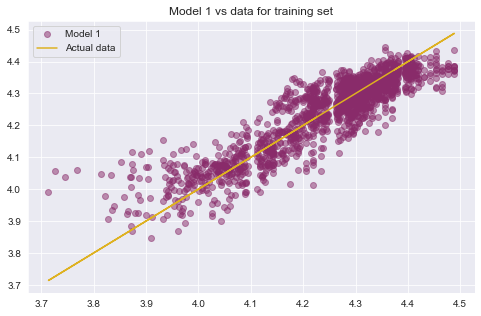

In [71]:
plt.figure(figsize=(8, 5))
plt.scatter(y1_train, y1_hat_train, color='#892B6A', label='Model 1', alpha=0.5)
plt.plot(y1_train, y1_train, color='#DEB120',  label='Actual data')
plt.title('Model 1 vs data for training set')
plt.legend();

#### Cross Validation 


Difference: -0.09596511911190277


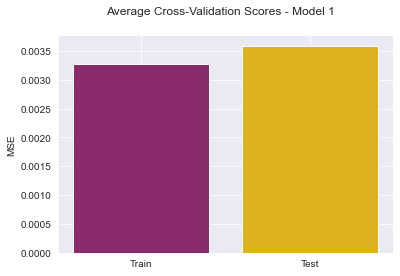

In [72]:
cv_5_results1 = -cross_val_score(linreg, X1, y1, cv=5, scoring="neg_mean_squared_error")
print('Difference:', ((train_mse1-cv_5_results1.mean())/ train_mse1))

fig, ax = plt.subplots()
labels = ["Train", "Test"]
colors = ["#892B6A", "#DEB120"]
ax.bar(labels, [train_mse1, cv_5_results1.mean()], color=colors)
ax.set_ylabel("MSE")
fig.suptitle("Average Cross-Validation Scores - Model 1");

Model 1 has permoved noticably better under testing, with the difference in MSE reduced from 15% to 9.6%. 

In [73]:
# Total Expenditure is droppped as it's P-value is greater than 0.05. 
df_log.drop('TotalExpenditure_log', axis=1, inplace=True)

KeyError: "['TotalExpenditure_log'] not found in axis"

In [43]:
subset = [ 'Schooling', 'Life_exp_log', 'AdultMortality_log','Infant_Deaths',
       'Alcohol_log', 'BMI_log', 'Polio_log', 'Diphtheria_log', 'HIV_AIDS_log',
       'Thinness_1_19Years_log', 'GDP_log']

In [44]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

subset_scaled = []
for var in subset:
    new_col = var +"_scaled"
    df_log[new_col] = scaler.fit_transform(df_log[[var]])
    subset_scaled.append(new_col)

In [45]:
df_log.head()

,Country,Status,Infant_Deaths,Schooling,Life_exp_log,AdultMortality_log,Alcohol_log,BMI_log,Polio_log,Diphtheria_log,...,Life_exp_log_scaled,AdultMortality_log_scaled,Infant_Deaths_scaled,Alcohol_log_scaled,BMI_log_scaled,Polio_log_scaled,Diphtheria_log_scaled,HIV_AIDS_log_scaled,Thinness_1_19Years_log_scaled,GDP_log_scaled
14,Afghanistan,Developing,88,5.9,4.012773,5.755742,-4.605170,2.533697,3.555348,3.496508,...,-1.832899,1.054038,1.995094,-2.479199,-1.123770,-4.612767,-4.511859,-0.63252,-0.339069,-1.643842
15,Afghanistan,Developing,88,5.5,4.003690,5.771441,-4.605170,2.501436,3.178054,3.178054,...,-1.903832,1.068984,1.995094,-2.479199,-1.163199,-6.527865,-6.004781,-0.63252,-0.245349,-1.659028
16,Albania,Developing,0,14.2,4.354141,4.304065,1.526056,4.060443,4.595120,4.595120,...,0.833103,-0.328029,-0.433757,0.442027,0.742201,0.664984,0.638475,-0.63252,-0.915588,0.465526
17,Albania,Developing,0,14.2,4.350278,2.079442,1.506297,4.046554,4.584967,4.584967,...,0.802930,-2.445978,-0.433757,0.432612,0.725226,0.613452,0.590880,-0.63252,-0.915588,0.553106
18,Albania,Developing,0,14.2,4.346399,4.430817,1.560248,4.034241,4.595120,4.595120,...,0.772640,-0.207355,-0.433757,0.458317,0.710176,0.664984,0.638475,-0.63252,-0.833127,0.531612


Scaling 

In [46]:
df_scaled = df_log.drop(columns=['Schooling', 'Life_exp_log', 'AdultMortality_log', 'Infant_Deaths','Alcohol_log',
       'BMI_log', 'Polio_log', 'Diphtheria_log', 'HIV_AIDS_log',
       'Thinness_1_19Years_log', 'GDP_log'], axis=1)

In [47]:
pd.DataFrame(df_scaled)

,Country,Status,Schooling_scaled,Life_exp_log_scaled,AdultMortality_log_scaled,Infant_Deaths_scaled,Alcohol_log_scaled,BMI_log_scaled,Polio_log_scaled,Diphtheria_log_scaled,HIV_AIDS_log_scaled,Thinness_1_19Years_log_scaled,GDP_log_scaled
14,Afghanistan,Developing,-2.164135,-1.832899,1.054038,1.995094,-2.479199,-1.123770,-4.612767,-4.511859,-0.632520,-0.339069,-1.643842
15,Afghanistan,Developing,-2.298490,-1.903832,1.068984,1.995094,-2.479199,-1.163199,-6.527865,-6.004781,-0.632520,-0.245349,-1.659028
16,Albania,Developing,0.623738,0.833103,-0.328029,-0.433757,0.442027,0.742201,0.664984,0.638475,-0.632520,-0.915588,0.465526
17,Albania,Developing,0.623738,0.802930,-2.445978,-0.433757,0.432612,0.725226,0.613452,0.590880,-0.632520,-0.915588,0.553106
18,Albania,Developing,0.623738,0.772640,-0.207355,-0.433757,0.458317,0.710176,0.664984,0.638475,-0.632520,-0.833127,0.531612
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2912,Zambia,Developing,-0.249572,-1.541818,1.199074,0.394261,0.111776,-3.256781,0.347639,0.395517,2.656057,0.856145,-0.281086
2922,Zimbabwe,Developing,-0.686226,-0.334054,1.112465,0.173456,0.442323,0.007694,0.067132,0.032725,2.376307,0.671387,-1.637762
2923,Zimbabwe,Developing,-0.686226,-1.300675,1.206804,0.201057,0.606758,-0.011675,0.292764,0.243459,2.387972,0.725149,-1.594946
2924,Zimbabwe,Developing,-0.652638,-1.460607,1.276074,0.256258,0.598626,-2.588802,0.455640,0.445126,2.443651,0.776244,-1.676738


In [48]:
x = ['Schooling_scaled', 'AdultMortality_log_scaled',
       'Alcohol_log_scaled', 'BMI_log_scaled', 'Polio_log_scaled',
       'Diphtheria_log_scaled', 'HIV_AIDS_log_scaled',
       'Thinness_1_19Years_log_scaled', 'GDP_log_scaled']

### Model 2 

1. Total Expenditure removed 
2. All continuous variables scaled to a mean of 0 to account to variance in scale. 

In [49]:
Model_2 = smf.ols(formula='Life_exp_log_scaled ~ Schooling_scaled + AdultMortality_log_scaled + Infant_Deaths_scaled+ Alcohol_log_scaled+Polio_log_scaled+Diphtheria_log_scaled + HIV_AIDS_log_scaled +Thinness_1_19Years_log_scaled+GDP_log_scaled', data=df_scaled).fit()
Model_2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                             OLS Regression Results                            
===============================================================================
Dep. Variable:     Life_exp_log_scaled   R-squared:                       0.802
Model:                             OLS   Adj. R-squared:                  0.802
Method:                  Least Squares   F-statistic:                     1061.
Date:                 Sat, 05 Nov 2022   Prob (F-statistic):               0.00
Time:                         23:27:59   Log-Likelihood:                -1437.1
No. Observations:                 2362   AIC:                             2894.
Df Residuals:                     2352   BIC:                             2952.
Df Model:                            9                                         
Covariance Type:             nonrobust                                         
=================================================================================================
                                    coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
Intercept                     -3.925e-16      0.009  -4.28e-14      1.000      -0.018       0.018
Schooling_scaled                  0.2567      0.015     17.571      0.000       0.228       0.285
AdultMortality_log_scaled        -0.0855      0.010     -8.597      0.000      -0.105      -0.066
Infant_Deaths_scaled             -0.0608      0.010     -6.145      0.000      -0.080      -0.041
Alcohol_log_scaled                0.0397      0.010      3.932      0.000       0.020       0.060
Polio_log_scaled                  0.1142      0.032      3.599      0.000       0.052       0.176
Diphtheria_log_scaled             0.0885      0.031      2.827      0.005       0.027       0.150
HIV_AIDS_log_scaled              -0.4158      0.013    -32.711      0.000      -0.441      -0.391
Thinness_1_19Years_log_scaled    -0.0960      0.011     -8.605      0.000      -0.118      -0.074
GDP_log_scaled                    0.0694      0.011      6.083      0.000       0.047       0.092
==============================================================================
Omnibus:                      238.085   Durbin-Watson:                   0.471
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              671.746
Skew:                          -0.541   Prob(JB):                    1.36e-146
Kurtosis:                       5.378   Cond. No.                         9.30
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [50]:
X2 = df_scaled.drop(columns=['Life_exp_log_scaled', 'Country', 'Status' ], axis=1)
y2 = df_scaled['Life_exp_log_scaled']
X2_train, X2_test, y2_train, y2_test = train_test_split(X2, y2, random_state=1)

linreg = LinearRegression()
linreg.fit(X2_train, y2_train)
LinearRegression()

LinearRegression()

In [51]:
y2_hat_train = linreg.predict(X2_train)
y2_hat_test = linreg.predict(X2_test)

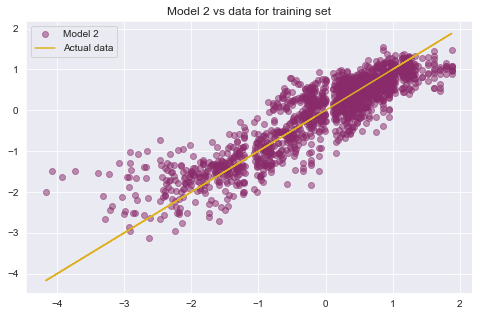

In [52]:
plt.figure(figsize=(8, 5))
plt.scatter(y2_train, y2_hat_train, color='#892B6A', label='Model 2', alpha=0.5)
plt.plot(y2_train, y2_train, color='#DEB120',  label='Actual data')
plt.title('Model 2 vs data for training set')
plt.legend();

In [53]:
train_mse2 = mean_squared_error(y2_train, y2_hat_train)
test_mse2 = mean_squared_error(y2_test, y2_hat_test)
print('Train Mean Squared Error:', train_mse2)
print('Test Mean Squared Error: ', test_mse2)
print('Difference:', ((train_mse2-test_mse2)/ train_mse2))

Train Mean Squared Error: 0.1997415504928261
Test Mean Squared Error:  0.19349967587138267
Difference: 0.031249755526793186


Difference: -0.08906949777159251


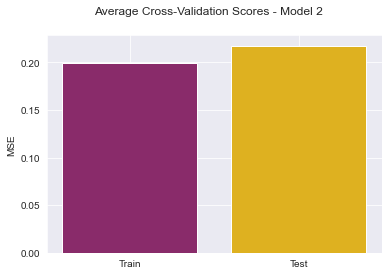

In [54]:
cv_5_results2 = -cross_val_score(linreg, X2, y2, cv=5, scoring="neg_mean_squared_error")
print('Difference:', ((train_mse2-cv_5_results2.mean())/ train_mse2))

fig, ax = plt.subplots()
ax.bar(labels, [train_mse2, cv_5_results2.mean()], color=colors)
ax.set_ylabel("MSE")
fig.suptitle("Average Cross-Validation Scores - Model 2");


Model 2 has performed slightly better, with now only a 8.9% difference between the test and training sets. 

In [ ]:
import numpy as np
def bias(y, y_hat):
    return np.mean(y_hat - y)

In [56]:
def variance(y_hat):
    return np.mean([yi**2 for yi in y_hat]) - np.mean(y_hat)**2

In [74]:
# Bias and variance for training set 
b = bias(y2_train, y2_hat_train) 
v = variance(y2_hat_train) 
print('Train bias: {} \nTrain variance: {}'.format(b, v))

# Bias and variance for test set 
b = bias(y2_test, y2_hat_test) 
v = variance(y2_hat_test) 
print('Test bias: {} \nTest variance: {}'.format(b, v))

Train bias: -1.3478145132377676e-17 
Train variance: 0.8283017404420914
Test bias: 0.004468471208779508 
Test variance: 0.7531556075358782


Model 2 appears to show an acceptable balance between bias and variance and we will accpet it as our final model. 

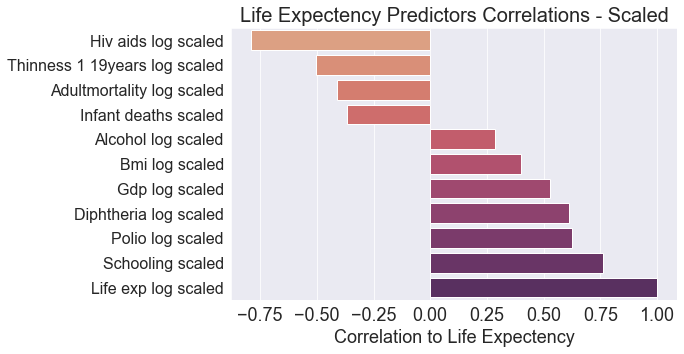

In [59]:
corr_data = df_scaled.corr()['Life_exp_log_scaled'].sort_values()
corr_data

fig, ax = plt.subplots(figsize=(8,5))
sns.barplot(x=corr_data.values, y=corr_data.index, orient='h', palette='flare')
ylabels = [item.capitalize() for item in corr_data.index]
ylabels = [item.split('_') for item in ylabels]
ylabels = [' '.join(item) for item in ylabels]
ax.set_yticklabels(ylabels, size=16)
ax.tick_params(axis='x', which='major', labelsize=18)
ax.set_xlabel('Correlation to Life Expectency', size=18)
ax.set_title('Life Expectency Predictors Correlations - Scaled', size=20)
plt.savefig("Feature_correlations_scaled.png");

### Examination of Final Dataset 

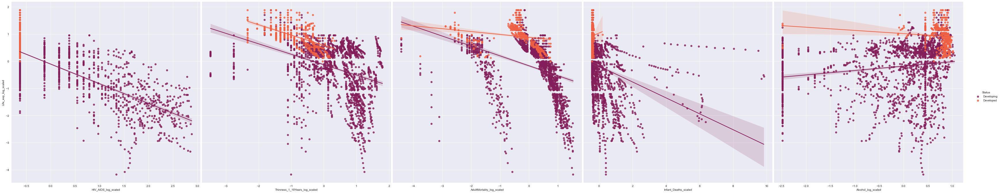

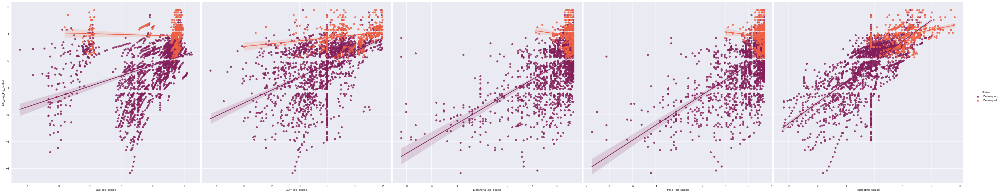

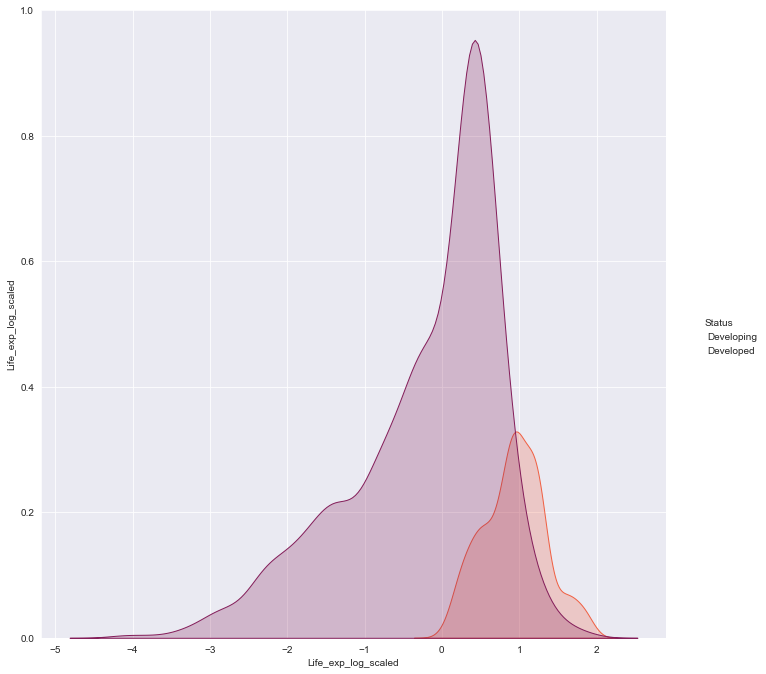

In [78]:
for i in range(0, len(corr_data.index), 5):
    sns.pairplot(data=df_scaled,
                x_vars = corr_data.index[i : i + 5 ],
                y_vars = ['Life_exp_log_scaled'], hue='Status', kind="reg", palette='rocket',  height=9.5)

<Figure size 432x288 with 0 Axes>

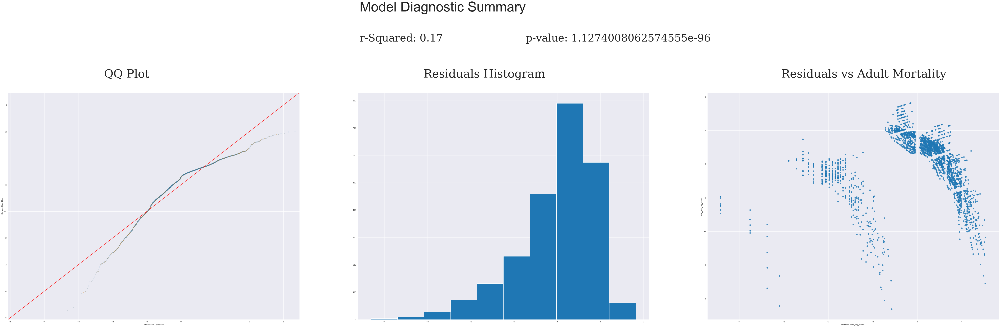

<Figure size 432x288 with 0 Axes>

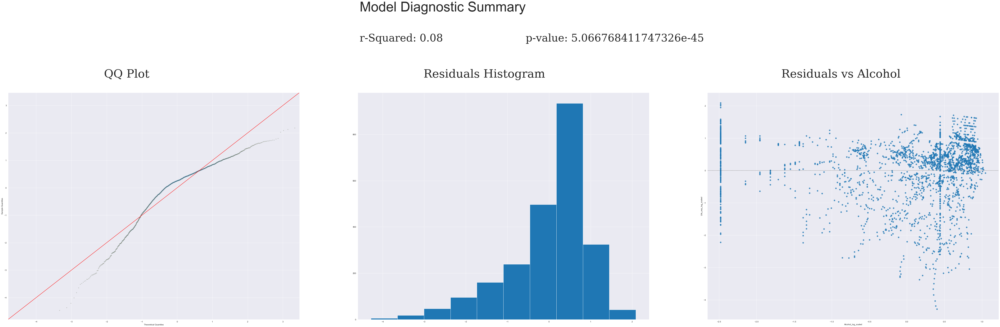

<Figure size 432x288 with 0 Axes>

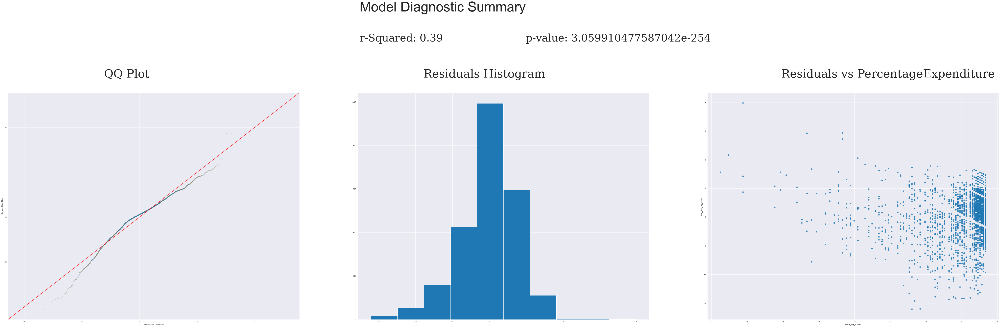

<Figure size 432x288 with 0 Axes>

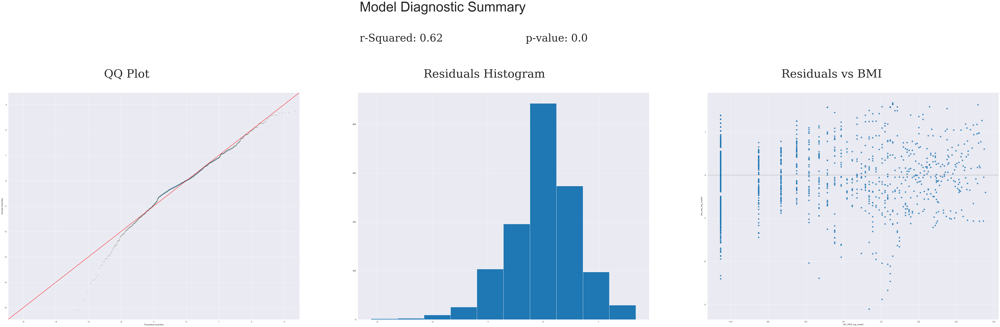

<Figure size 432x288 with 0 Axes>

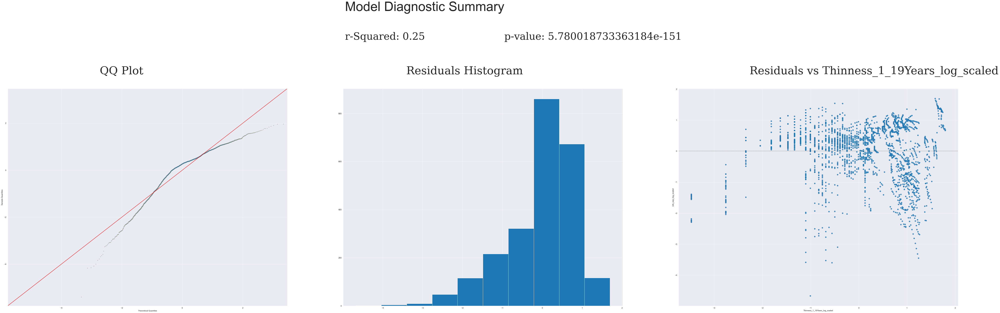

<Figure size 432x288 with 0 Axes>

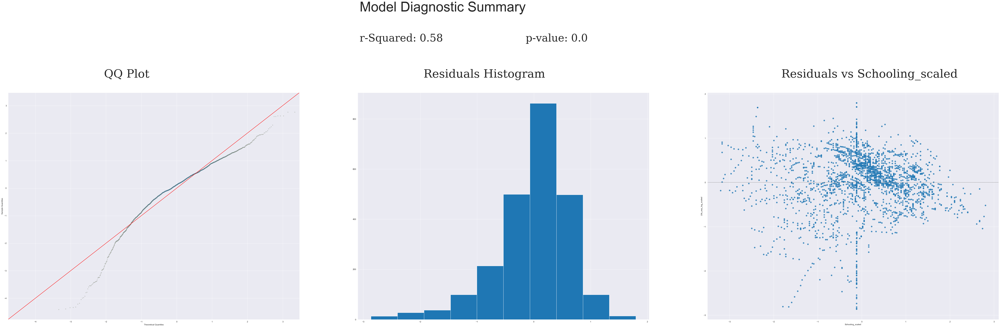

<Figure size 432x288 with 0 Axes>

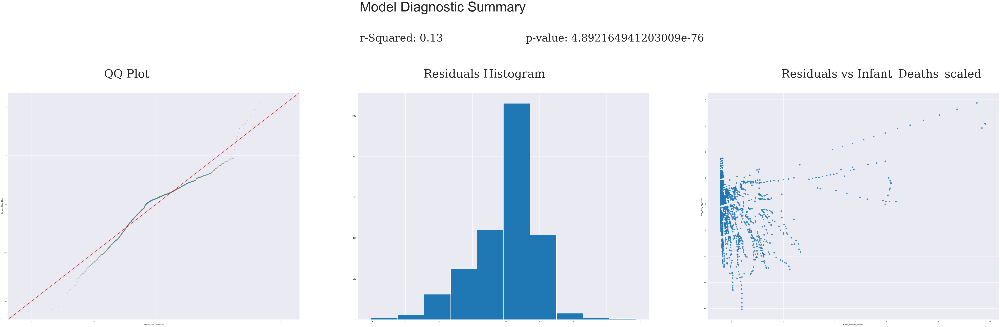

<Figure size 432x288 with 0 Axes>

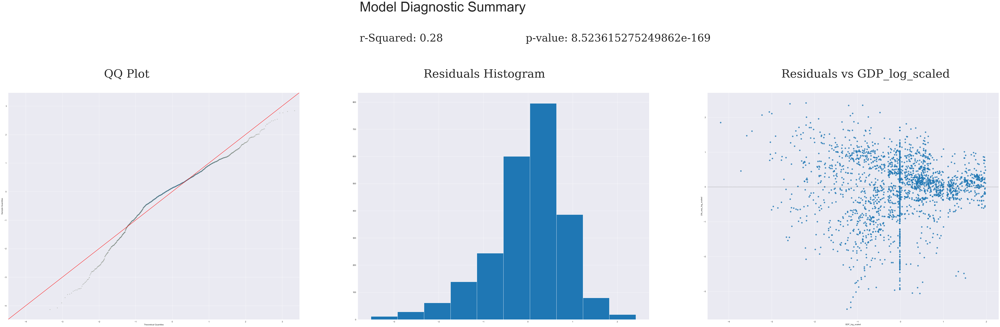

<Figure size 432x288 with 0 Axes>

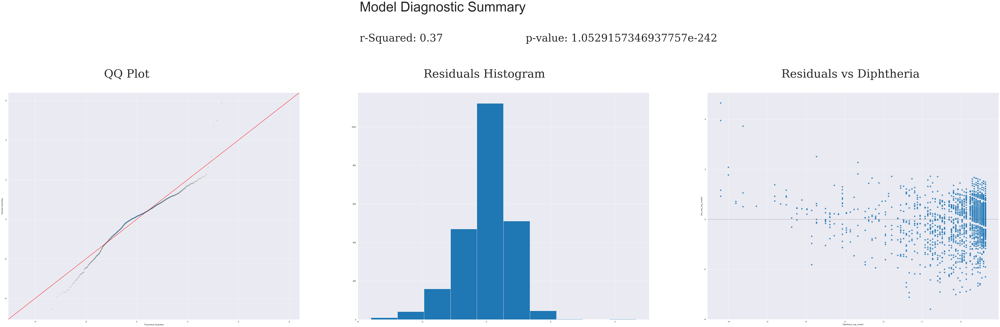

In [61]:
Life_exp = df_scaled['Life_exp_log_scaled']

f = "Life_exp_log_scaled~AdultMortality_log_scaled"
AdultMortality = smf.ols(formula=f, data=df_scaled).fit()
model_diagnostic(AdultMortality, df_scaled['AdultMortality_log_scaled'], 'Adult Mortality', Life_exp)

f = "Life_exp_log_scaled~Alcohol_log_scaled"
Alcohol = smf.ols(formula=f, data=df_scaled).fit()
model_diagnostic(Alcohol, df_scaled['Alcohol_log_scaled'], 'Alcohol', Life_exp)

f = "Life_exp_log_scaled~Polio_log_scaled"
Polio = smf.ols(formula=f, data=df_scaled).fit()
model_diagnostic(Polio, df_scaled['Polio_log_scaled'], 'PercentageExpenditure', Life_exp)

f = "Life_exp_log_scaled~HIV_AIDS_log_scaled"
BMI = smf.ols(formula=f, data=df_scaled).fit()
model_diagnostic(BMI, df_scaled['HIV_AIDS_log_scaled'], 'BMI', Life_exp)

f = "Life_exp_log_scaled~ Thinness_1_19Years_log_scaled"
Thinness_1_19 = smf.ols(formula=f, data=df_scaled).fit()
model_diagnostic(Thinness_1_19, df_scaled['Thinness_1_19Years_log_scaled'], 'Thinness_1_19Years_log_scaled', Life_exp)

f = "Life_exp_log_scaled~Schooling_scaled"
Schooling = smf.ols(formula=f, data=df_scaled).fit()
model_diagnostic(Schooling, df_scaled['Schooling_scaled'], 'Schooling_scaled', Life_exp)

f = "Life_exp_log_scaled~Infant_Deaths_scaled"
InfantDeaths = smf.ols(formula=f, data=df_scaled).fit()
model_diagnostic(InfantDeaths, df_scaled['Infant_Deaths_scaled'], 'Infant_Deaths_scaled', Life_exp)

f = "Life_exp_log_scaled~GDP_log_scaled"
GDP = smf.ols(formula=f, data=df_scaled).fit()
model_diagnostic(GDP, df_scaled['GDP_log_scaled'], 'GDP_log_scaled', Life_exp)

f = "Life_exp_log_scaled~Diphtheria_log_scaled"
Diphtheria = smf.ols(formula=f, data=df_scaled).fit()
model_diagnostic(Diphtheria, df_scaled['Diphtheria_log_scaled'], 'Diphtheria', Life_exp)